# Import Libraries

In [87]:
import numpy as np
import SimpleITK as sitk
import matplotlib.pyplot as plt
import seaborn as sns
from tabulate import tabulate
from PIL import Image, ImageDraw, ImageFont
import math
import pandas as pd
from pathlib import Path

# Utils

In [88]:
#==============================
# Colors for different nodule labels
#==============================
COLORS = [
    (255,   0,   0, 120),   # Red
    (  0, 255,   0, 120),   # Green
    (  0,   0, 255, 120),   # Blue
    (255, 255,   0, 120),   # Yellow
    (255,   0, 255, 120),   # Magenta
    (  0, 255, 255, 120),   # Cyan
    (255, 128,   0, 120),   # Orange
    (128,   0, 255, 120),   # Purple
]

#==============================
# Overlay Mask on CT
#==============================
def overlay_mask_on_ct(ct_slice, mask_slice, colors, title=""):
    """
    Overlay a segmentation mask on a CT slice.

    Parameters
    ----------
    ct_slice : ndarray
        2D CT slice.
    mask_slice : ndarray
        2D segmentation mask.
    colors : list
        RGBA colors for each label.
    title : str
        Image title.

    Returns
    -------
    PIL.Image
        Overlay image.
    """

    # Normalize CT
    ct_norm = (ct_slice - ct_slice.min()) / (ct_slice.max() - ct_slice.min())
    ct_uint8 = (ct_norm * 255).astype(np.uint8)

    ct_img = Image.fromarray(ct_uint8).convert("RGB")

    # Create transparent overlay
    overlay = Image.new("RGBA", ct_img.size, (0, 0, 0, 0))
    overlay_pixels = overlay.load()

    labels = np.unique(mask_slice)
    labels = labels[labels > 0]

    for label in labels:

        color = colors[(label - 1) % len(colors)]

        ys, xs = np.where(mask_slice == label)

        for y, x in zip(ys, xs):
            overlay_pixels[x, y] = color

    result = Image.alpha_composite(
        ct_img.convert("RGBA"),
        overlay
    ).convert("RGB")

    # Add title
    title_height = 25

    canvas = Image.new(
        "RGB",
        (result.width, result.height + title_height),
        "white"
    )

    canvas.paste(result, (0, title_height))

    draw = ImageDraw.Draw(canvas)
    draw.text((5, 5), title, fill="black")

    return canvas


#==============================
# Create Image Grid
#==============================
def create_image_grid(images, cols=5, padding=15):
    """
    Arrange images into a grid.
    """

    rows = math.ceil(len(images) / cols)

    img_w = images[0].width
    img_h = images[0].height

    grid = Image.new(
        "RGB",
        (
            cols * img_w + (cols - 1) * padding,
            rows * img_h + (rows - 1) * padding,
        ),
        "white",
    )

    for i, img in enumerate(images):

        row = i // cols
        col = i % cols

        x = col * (img_w + padding)
        y = row * (img_h + padding)

        grid.paste(img, (x, y))

    return grid


#==============================
# Extract Mask ScanLevel-Atributes 
#==============================
def extract_mask_scan_level_attributes(mask_image):
    """
    Extract scan-level attributes from a LNDb mask.

    Parameters
    ----------
    mask_image : SimpleITK.Image
        LNDb mask image.

    Returns
    -------
    dict
        Dictionary containing scan-level attributes.
    """

    # Convert to NumPy array
    mask_volume = sitk.GetArrayFromImage(mask_image)

    # Image information
    size = mask_image.GetSize()
    spacing = mask_image.GetSpacing()
    shape = mask_volume.shape

    # Find slices containing nodules
    nodule_slices = np.where(np.any(mask_volume > 0, axis=(1, 2)))[0]

    # Number of nodules (exclude background label 0)
    num_nodules = len(np.unique(mask_volume)) - 1

    # Number of voxels belonging to nodules
    mask_voxel_count = int(np.count_nonzero(mask_volume))

    # Physical volume of one voxel (mm³)
    voxel_volume_mm3 = spacing[0] * spacing[1] * spacing[2]

    # Total nodule volume (mm³)
    total_nodule_volume_mm3 = mask_voxel_count * voxel_volume_mm3

    attributes = {
        "size": size,
        "spacing": spacing,
        "shape": shape,

        "num_nodules": num_nodules,

        "slice_start": int(nodule_slices[0]),
        "slice_end": int(nodule_slices[-1]),
        "num_slices_with_nodule": len(nodule_slices),

        "mask_voxel_count": mask_voxel_count,
        "voxel_volume_mm3": voxel_volume_mm3,
        "total_nodule_volume_mm3": total_nodule_volume_mm3,

        "nodule_slices": nodule_slices.tolist()
    }

    return attributes

# Configuration

In [89]:
CT_PATH = "../dataset_sample/lndb/data/LNDb-0001.mhd"
MASK_PATHS = [
    "../dataset_sample/lndb/masks/LNDb-0001_rad1.mhd",
    "../dataset_sample/lndb/masks/LNDb-0001_rad2.mhd",
    "../dataset_sample/lndb/masks/LNDb-0001_rad3.mhd",
]

# Load .mhd Data

In [90]:
# load scan data
# .mhd is metadata file
ct = sitk.ReadImage(CT_PATH)
mask = sitk.ReadImage(MASK_PATHS[0])

# get numpy array from SimpleITK image object
ct_volume = sitk.GetArrayFromImage(ct)
mask_volume = sitk.GetArrayFromImage(mask)

print(f"CT Size: {ct.GetSize()}")
print(f"Mask Size: {mask.GetSize()}")
print(f"Mask Shape: {mask_volume.shape}")
print(f"Mask Unique Value: {np.unique(mask_volume)}")

CT Size: (512, 512, 328)
Mask Size: (512, 512, 328)
Mask Shape: (328, 512, 512)
Mask Unique Value: [0 1 2]


# Metadata Inside .mhd File

In [91]:
data_scan = [
    ['CT size', ct.GetSize(), type(ct.GetSize())],
    ['CT spacing', ct.GetSpacing(), type(ct.GetSpacing())],
    ['Mask size', mask.GetSize(), type(mask.GetSize())],
    ['Mask spacing', mask.GetSpacing(), type(mask.GetSpacing())],
    ['CT shape', ct_volume.shape, type(ct_volume.shape)],
    ['Mask shape', mask_volume.shape, type(mask_volume.shape)],
    ['CT min HU', ct_volume.min(), type(ct_volume.min())],
    ['CT max HU', ct_volume.max(), type(ct_volume.max())],
    ['Mask unique values', np.unique(mask_volume).tolist(), type(np.unique(mask_volume))]
]

print(tabulate(
    data_scan,
    headers=['Attribute','Value','Type'],
    tablefmt='grid'
))

+--------------------+---------------------------------+-------------------------+
| Attribute          | Value                           | Type                    |
+====================+=================================+=========================+
| CT size            | (512, 512, 328)                 | <class 'tuple'>         |
+--------------------+---------------------------------+-------------------------+
| CT spacing         | (0.607421875, 0.607421875, 1.0) | <class 'tuple'>         |
+--------------------+---------------------------------+-------------------------+
| Mask size          | (512, 512, 328)                 | <class 'tuple'>         |
+--------------------+---------------------------------+-------------------------+
| Mask spacing       | (0.607421875, 0.607421875, 1.0) | <class 'tuple'>         |
+--------------------+---------------------------------+-------------------------+
| CT shape           | (328, 512, 512)                 | <class 'tuple'>         |
+---

```text
- Size and Spacing Format -> (x, y, z) or (width, height, slice)
- Shape Format            -> (z, x, y) or (slice, width, height)
```

# Visualizing CT Images with Nodule Mask Overlay

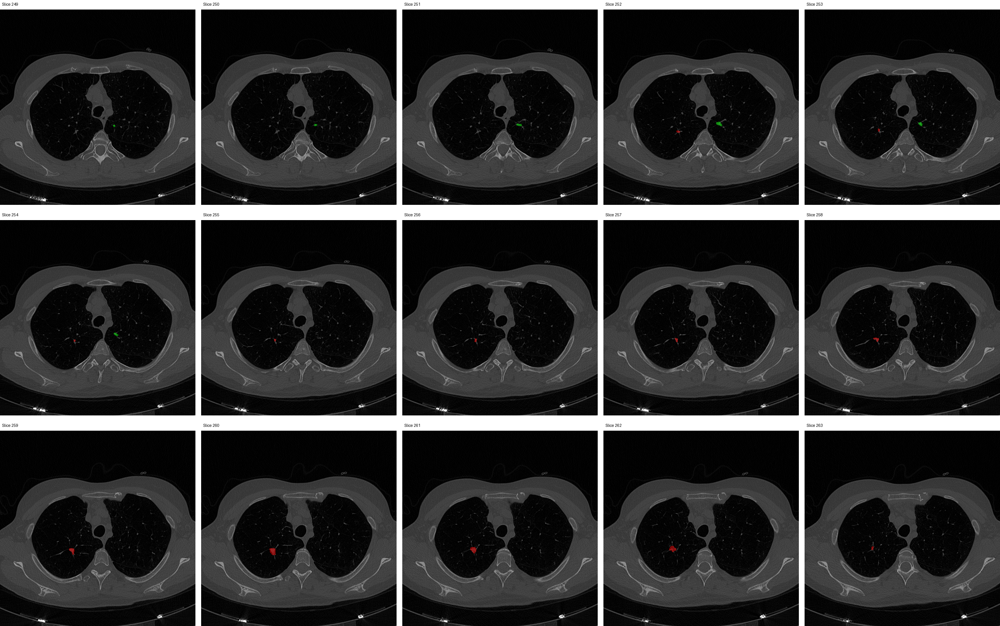

In [92]:
slices = np.where(np.any(mask_volume > 0, axis=(1, 2)))[0]

images = []

for slice_idx in slices:

    images.append(
        overlay_mask_on_ct(
            ct_volume[slice_idx],
            mask_volume[slice_idx],
            COLORS,
            title=f"Slice {slice_idx}"
        )
    )

grid = create_image_grid(images, cols=5)

display(grid)

# Mask From Multiple Radiologists

In [93]:
masks = [sitk.ReadImage(path) for path in MASK_PATHS]

scan_attributes = []

for mask in masks:
    scan_attributes.append(extract_mask_scan_level_attributes(mask))

df = pd.DataFrame(scan_attributes)
display(df)

,size,spacing,shape,num_nodules,slice_start,slice_end,num_slices_with_nodule,mask_voxel_count,voxel_volume_mm3,total_nodule_volume_mm3,nodule_slices
0,"(512, 512, 328)","(0.607421875, 0.607421875, 1.0)","(328, 512, 512)",2,249,263,15,1608,0.368961,593.289825,"[249, 250, 251, 252, 253, 254, 255, 256, 257, ..."
1,"(512, 512, 328)","(0.607421875, 0.607421875, 1.0)","(328, 512, 512)",1,260,260,1,154,0.368961,56.820045,[260]
2,"(512, 512, 328)","(0.607421875, 0.607421875, 1.0)","(328, 512, 512)",1,257,262,6,458,0.368961,168.984291,"[257, 258, 259, 260, 261, 262]"


Rad_1


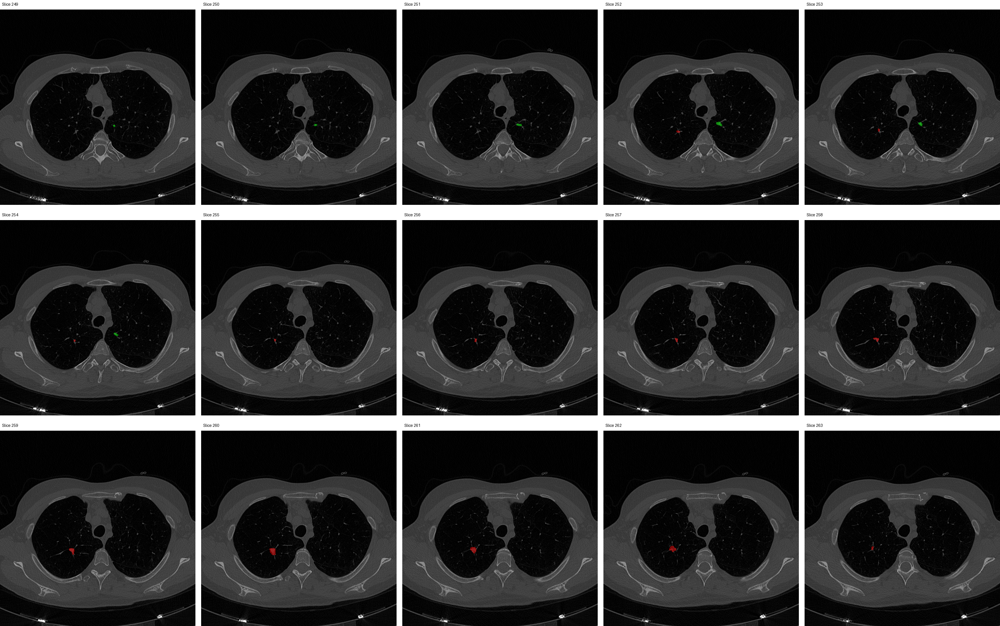

Rad_2


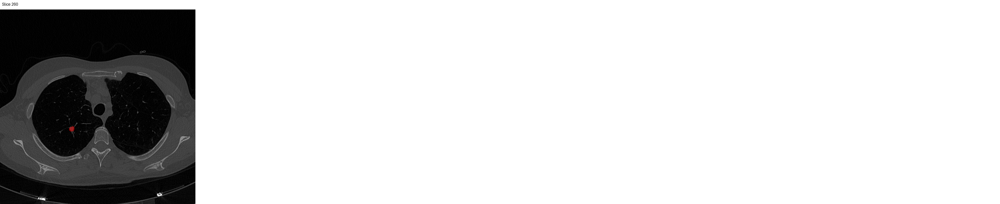

Rad_3


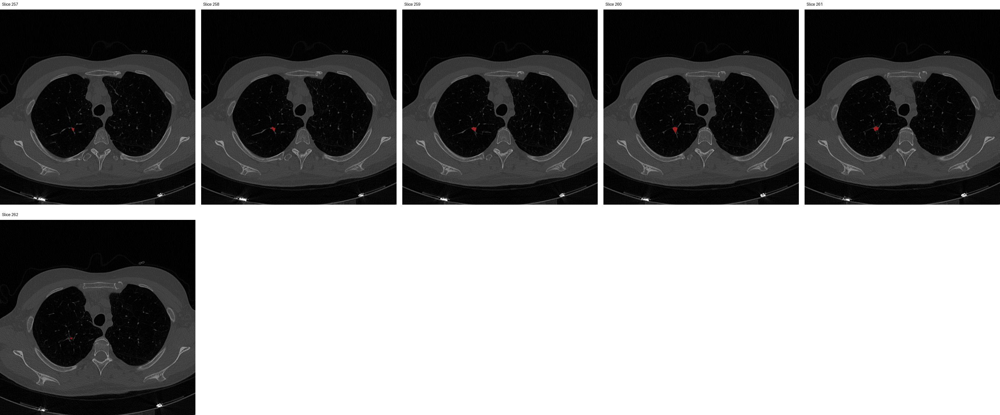

In [94]:
for i, mask in enumerate(masks, start=1):
    mask_volume = sitk.GetArrayFromImage(mask)
    slices = np.where(np.any(mask_volume > 0, axis=(1, 2)))[0]

    images = []

    print(f"Rad_{i}")
    for slice_idx in slices:

        images.append(
            overlay_mask_on_ct(
                ct_volume[slice_idx],
                mask_volume[slice_idx],
                COLORS,
                title=f"Slice {slice_idx}"
            )
        )

    grid = create_image_grid(images, cols=5)

    display(grid)


# Explore Train Dataset

## trainNodules_gt.csv

In [95]:
train_nodules_gt_df = pd.read_csv("../lndb_dataset/trainset_csv/trainNodules_gt.csv")

train_nodules_gt_df.columns = (
    train_nodules_gt_df.columns
    .str.strip()
    .str.lower()
)

print(f"train_nodules_gt_df shape: {train_nodules_gt_df.shape}\n")
train_nodules_gt_df.info()

train_nodules_gt_df shape: (1219, 11)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1219 entries, 0 to 1218
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lndbid        1219 non-null   int64  
 1   radid         1219 non-null   object 
 2   radfindingid  1219 non-null   object 
 3   findingid     1219 non-null   int64  
 4   x             1219 non-null   float64
 5   y             1219 non-null   float64
 6   z             1219 non-null   float64
 7   agrlevel      1219 non-null   int64  
 8   nodule        1219 non-null   int64  
 9   volume        1219 non-null   float64
 10  text          1219 non-null   float64
dtypes: float64(5), int64(4), object(2)
memory usage: 104.9+ KB


In [96]:
display(train_nodules_gt_df.head())

,lndbid,radid,radfindingid,findingid,x,y,z,agrlevel,nodule,volume,text
0,1,"1,2,3","1,1,1",1,-44.203451,-119.073242,-37.5,3,1,222.360697,5.0
1,1,1,2,2,25.852539,-126.969727,-45.5,1,1,152.381031,4.0
2,2,"1,2,3","1,1,3",1,88.895508,-123.867513,-129.5,3,1,378.042297,5.0
3,2,"1,3","2,2",2,63.534180,-112.756836,-117.5,2,1,174.844563,5.0
4,2,"1,3","3,5",3,-103.850586,-116.742188,-253.0,2,1,297.708309,5.0


### Descriptive Statistics

In [97]:
train_nodules_gt_df.describe()

,lndbid,findingid,x,y,z,agrlevel,nodule,volume,text
count,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000
mean,161.958983,4.319114,-4.407684,-124.852972,-567.446736,0.847416,0.630025,163.001685,2.831419
std,95.907916,3.242886,85.964937,71.159806,478.897883,0.797996,0.482996,867.419936,2.291466
min,1.000000,1.000000,-207.910156,-293.310547,-1239.142085,0.000000,0.000000,14.137167,0.000000
25%,71.000000,2.000000,-79.974219,-168.577639,-1029.912510,0.000000,0.000000,14.137167,0.000000
50%,165.000000,3.000000,-32.315630,-122.079273,-432.000000,1.000000,1.000000,17.022095,4.000000
75%,255.000000,6.000000,80.853239,-90.566679,-162.250000,1.000000,1.000000,65.818443,5.000000
max,312.000000,20.000000,172.203323,277.203125,1019.000000,3.000000,1.000000,15373.215885,5.000000


### Nodule vs Non-Nodule Distribution

```text
- nodule = 0 -> Non-Nodule
- nodule = 1 -> Nodule
```

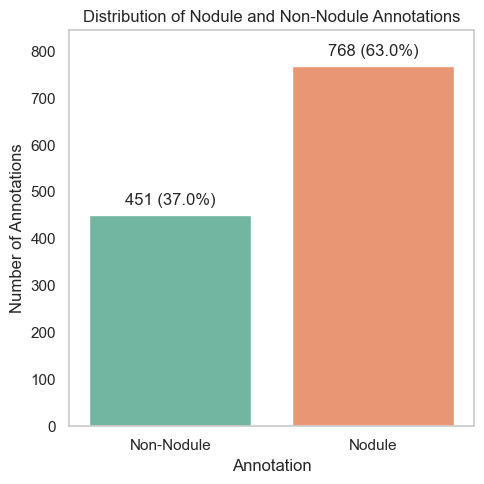

In [98]:
# Count each class
annotation_distribution = (
    train_nodules_gt_df["nodule"]
    .value_counts()
    .sort_index()
    .rename(index={0: "Non-Nodule", 1: "Nodule"})
)

# Display summary
summary_df = annotation_distribution.reset_index()
summary_df.columns = ["Annotation", "Count"]
summary_df["Percentage"] = (
    summary_df["Count"] / summary_df["Count"].sum() * 100
)

# Visualization
sns.set_theme(style="whitegrid")

plt.figure(figsize=(5, 5))

ax = sns.barplot(
    data=summary_df,
    x="Annotation",
    y="Count",
    palette="Set2",
    hue="Annotation"
)

# Add count and percentage labels
for i, row in summary_df.iterrows():
    ax.text(
        i,
        row["Count"] + summary_df["Count"].max() * 0.02,
        f'{row["Count"]} ({row["Percentage"]:.1f}%)',
        ha="center",
        va="bottom",
        fontsize=12
    )

plt.title("Distribution of Nodule and Non-Nodule Annotations")
plt.xlabel("Annotation")
plt.ylabel("Number of Annotations")

plt.grid(False)
plt.ylim(0, summary_df["Count"].max() * 1.1)
plt.tight_layout()
plt.show()

### Drop Non-Nodule Annotation

In [99]:
train_nodules_only_df = train_nodules_gt_df[
    train_nodules_gt_df["nodule"] != 0
]

print(f"train_nodules_gt_df shape: {train_nodules_only_df.shape}\n")
train_nodules_only_df.info()

train_nodules_gt_df shape: (768, 11)

<class 'pandas.core.frame.DataFrame'>
Index: 768 entries, 0 to 1212
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lndbid        768 non-null    int64  
 1   radid         768 non-null    object 
 2   radfindingid  768 non-null    object 
 3   findingid     768 non-null    int64  
 4   x             768 non-null    float64
 5   y             768 non-null    float64
 6   z             768 non-null    float64
 7   agrlevel      768 non-null    int64  
 8   nodule        768 non-null    int64  
 9   volume        768 non-null    float64
 10  text          768 non-null    float64
dtypes: float64(5), int64(4), object(2)
memory usage: 72.0+ KB


### Agreement Level Distribution

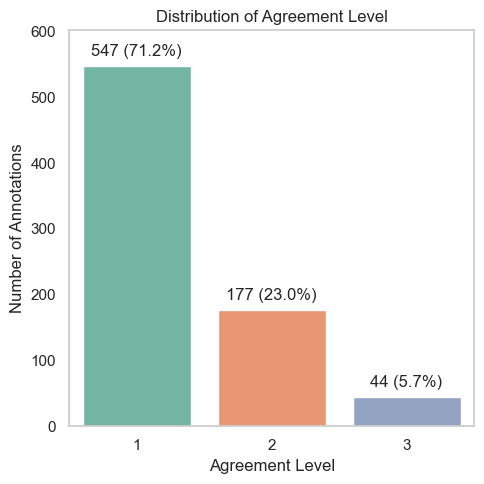

In [100]:
# Count each class
agrlevel_distribution = (
    train_nodules_only_df["agrlevel"]
    .value_counts()
    .sort_index()
)

# Display summary
summary_df = agrlevel_distribution.reset_index()
summary_df.columns = ["Agreement Level", "Count"]
summary_df["Percentage"] = (
    summary_df["Count"] / summary_df["Count"].sum() * 100
)

# Visualization
sns.set_theme(style="whitegrid")

plt.figure(figsize=(5, 5))

ax = sns.barplot(
    data=summary_df,
    x="Agreement Level",
    y="Count",
    palette="Set2",
    hue="Agreement Level"
)
ax.legend_.remove()

# Add count and percentage labels
for i, row in summary_df.iterrows():
    ax.text(
        i,
        row["Count"] + summary_df["Count"].max() * 0.02,
        f'{int(row["Count"])} ({row["Percentage"]:.1f}%)',
        ha="center",
        va="bottom",
        fontsize=12
    )

plt.title("Distribution of Agreement Level")
plt.xlabel("Agreement Level")
plt.ylabel("Number of Annotations")

plt.grid(False)
plt.ylim(0, summary_df["Count"].max() * 1.1)
plt.tight_layout()
plt.show()

## Join Left `train_nodules_only_df` & `allNods.csv`

In [101]:
train_nodules_only_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 768 entries, 0 to 1212
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lndbid        768 non-null    int64  
 1   radid         768 non-null    object 
 2   radfindingid  768 non-null    object 
 3   findingid     768 non-null    int64  
 4   x             768 non-null    float64
 5   y             768 non-null    float64
 6   z             768 non-null    float64
 7   agrlevel      768 non-null    int64  
 8   nodule        768 non-null    int64  
 9   volume        768 non-null    float64
 10  text          768 non-null    float64
dtypes: float64(5), int64(4), object(2)
memory usage: 72.0+ KB


In [102]:
train_nodules_processed_df = train_nodules_only_df.copy()
train_nodules_processed_df = train_nodules_processed_df.drop(columns=["x", "y", "z", "nodule", "volume", "text"])
# Load CSV files
all_nodules_df = pd.read_csv("../lndb_dataset/allNods.csv")
all_nodules_df = all_nodules_df[["LNDbID", "FindingID", "Malignancy"]]

all_nodules_df.columns = (
    all_nodules_df.columns
    .str.strip()
    .str.lower()
)

# Merge based on LNDbID and FindingID
merged_nodules_df = pd.merge(
    train_nodules_processed_df,
    all_nodules_df,
    on=["lndbid", "findingid"],
    how="left",
    suffixes=("_gt", "_all")
)

# Display merged information
# Display information
print(f"train_nodules_processed_df shape: {train_nodules_processed_df.shape}")
print(f"all_nodules_df shape: {all_nodules_df.shape}")
print(f"merged_nodules_df shape: {merged_nodules_df.shape}\n")
print(merged_nodules_df.info())

train_nodules_processed_df shape: (768, 5)
all_nodules_df shape: (1234, 3)
merged_nodules_df shape: (768, 6)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lndbid        768 non-null    int64  
 1   radid         768 non-null    object 
 2   radfindingid  768 non-null    object 
 3   findingid     768 non-null    int64  
 4   agrlevel      768 non-null    int64  
 5   malignancy    751 non-null    float64
dtypes: float64(1), int64(3), object(2)
memory usage: 36.1+ KB
None


### Drop "Malginancy = Missing Value"

In [103]:
merged_nodules_df = merged_nodules_df.dropna(
    subset=["malignancy"]
)

print(f"merged_nodules_df shape: {merged_nodules_df.shape}\n")
print(merged_nodules_df.info())

merged_nodules_df shape: (751, 6)

<class 'pandas.core.frame.DataFrame'>
Index: 751 entries, 0 to 767
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lndbid        751 non-null    int64  
 1   radid         751 non-null    object 
 2   radfindingid  751 non-null    object 
 3   findingid     751 non-null    int64  
 4   agrlevel      751 non-null    int64  
 5   malignancy    751 non-null    float64
dtypes: float64(1), int64(3), object(2)
memory usage: 41.1+ KB
None


In [104]:
merged_nodules_df.head()

,lndbid,radid,radfindingid,findingid,agrlevel,malignancy
0,1,"1,2,3","1,1,1",1,3,2.0
1,1,1,2,2,1,2.0
2,2,"1,2,3","1,1,3",1,3,1.0
3,2,"1,3","2,2",2,2,1.0
4,2,"1,3","3,5",3,2,2.5


### Descriptive Statistics

In [105]:
merged_nodules_df.describe()

,lndbid,findingid,agrlevel,malignancy
count,751.000000,751.000000,751.000000,751.000000
mean,152.131824,3.323569,1.352863,2.199290
std,96.495153,2.539389,0.588208,1.015368
min,1.000000,1.000000,1.000000,0.000000
25%,65.000000,1.000000,1.000000,1.000000
50%,152.000000,3.000000,1.000000,2.000000
75%,248.000000,4.000000,2.000000,3.000000
max,311.000000,16.000000,3.000000,5.000000


### Malignancy Distribution

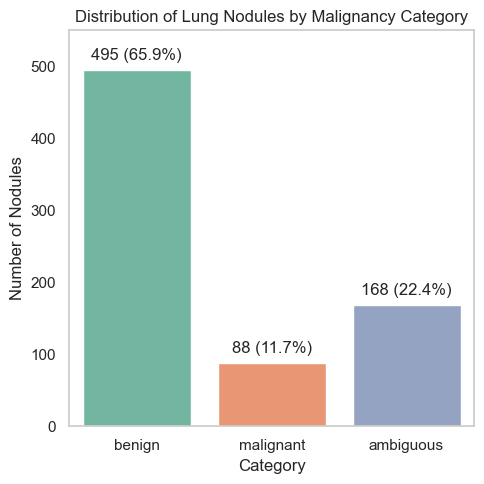

In [106]:
# Categorize malignancy
def categorize_malignancy(score):
    if 1.0 <= score <= 2.5:
        return "benign"
    elif 3.5 <= score <= 5.0:
        return "malignant"
    else:
        return "ambiguous"

merged_nodules_df["category"] = (
    merged_nodules_df["malignancy"]
    .apply(categorize_malignancy)
)

# Count each malignancy
malignancy_distribution = (
    merged_nodules_df["category"]
    .value_counts()
    .reindex(["benign", "malignant", "ambiguous"])
)

# Display summary
summary_df = malignancy_distribution.reset_index()
summary_df.columns = ["Category", "Count"]

summary_df["Percentage"] = (
    summary_df["Count"] / summary_df["Count"].sum() * 100
)

# Visualization
sns.set_theme(style="whitegrid")

plt.figure(figsize=(5,5))

ax = sns.barplot(
    data=summary_df,
    x="Category",
    y="Count",
    hue="Category",
    palette="Set2",
    legend=False
)

# Add count and percentage labels
for i, row in summary_df.iterrows():
    ax.text(
        i,
        row["Count"] + summary_df["Count"].max()*0.02,
        f'{row["Count"]} ({row["Percentage"]:.1f}%)',
        ha="center",
        va="bottom",
        fontsize=12
    )

plt.title("Distribution of Lung Nodules by Malignancy Category")
plt.xlabel("Category")
plt.ylabel("Number of Nodules")

plt.grid(False)
plt.ylim(0, summary_df["Count"].max()*1.11)
plt.tight_layout()
plt.show()

### Drop Malignancy = Ambiguous

In [107]:
merged_nodules_df = merged_nodules_df[merged_nodules_df["category"] != "ambiguous"].reset_index(drop=True)
merged_nodules_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 583 entries, 0 to 582
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lndbid        583 non-null    int64  
 1   radid         583 non-null    object 
 2   radfindingid  583 non-null    object 
 3   findingid     583 non-null    int64  
 4   agrlevel      583 non-null    int64  
 5   malignancy    583 non-null    float64
 6   category      583 non-null    object 
dtypes: float64(1), int64(3), object(3)
memory usage: 32.0+ KB


In [108]:
merged_nodules_df.head()

,lndbid,radid,radfindingid,findingid,agrlevel,malignancy,category
0,1,"1,2,3","1,1,1",1,3,2.0,benign
1,1,1,2,2,1,2.0,benign
2,2,"1,2,3","1,1,3",1,3,1.0,benign
3,2,"1,3","2,2",2,2,1.0,benign
4,2,"1,3","3,5",3,2,2.5,benign


In [109]:
merged_nodules_df.to_csv('../dataset_sample/trainNodules_gt_clean.csv', index=False)